# Problem list 1

## Lecture 2: Polynomials and Affine Space

**1.** Consider the polynomial $g(x,y) = x^2y + y^2x \in \mathbb{F}_2[x,y]$. Show that $g(x,y) = 0$ for every $(x,y) \in \mathbb{F}_2^2$, and explain why this does not contradict Proposition 5.

$\circ$ Let's just use Sage in order to check if this polynomial is zero-function:

In [1]:
R.<x,y> = PolynomialRing(GF(2))
poly = x**2 * y + y**2 * x
for el in AffineSpace(R):
    print(poly(*el))

0
0
0
0


So, $g(x,y) = 0$. This doesn't contradict Prop. 5 though since $\mathbb{F}_2$ is not an infinite field. $\bullet$

**2.** Find a nonzero polynomial in $\mathbb{F}_2[x, y, z]$ which vanishes at every point of $\mathbb{F}^3_2$. Try to find one involving all three variables.

$\circ$ Seems, $g(x,y,z) = x(y+z) + y(x+z) + z(x+y)$ does the job:

In [2]:
R.<x,y,z> = PolynomialRing(GF(2))
poly = x * (y + z) + y * (x + z) + z * (x + y)
for el in AffineSpace(R):
    print(poly(*el))

0
0
0
0
0
0
0
0


**3.** Consider $f(x, y, z) = x^5 y^2 z − x^4 y^3 + y^5 + x^2z − y^3 z + xy + 2x − 5z + 3$.

 (a) Write $f$ as a polynomial in $x$ with coefficients in $\mathbb{K}[y, z]$.
 
 (b) Write $f$ as a polynomial in $y$ with coefficients in $\mathbb{K}[x, z]$.
 
 (c) Write $f$ as a polynomial in $z$ with coefficients in $\mathbb{K}[x, y]$.

$\circ$ (a): $f(x) = (y^2 z)x^5 − ( y^3)x^4 + (z)x^2 + (y + 2)x + (y^5  − y^3 z − 5z + 3)$,

(b): $f(y) = y^5 − (x^4 + z)y^3 + (x^5 z) y^2 + (x)y + (x^2z  + 2x − 5z + 3)$,

(c): $f(z) = (x^5 y^2 + x^2 − y^3 − 5) z − (x^4 y^3 + y^5 + xy + 2x + 3)$. $\bullet$

## Lecture 3: Affine Varieties

**1.** In the plane $\mathbb{R}^2$, draw a picture to illustrate

$$ V(x^2 + y^2 − 4) \cap V (xy − 1) = V (x^2 + y^2 − 4, xy − 1), $$

and determine the points of intersection.

$\circ$ Let's draw it:

verbose 0 (2285: multi_polynomial_ideal.py, variety) Warning: falling back to very slow toy implementation.
verbose 0 (2285: multi_polynomial_ideal.py, variety) Warning: falling back to very slow toy implementation.


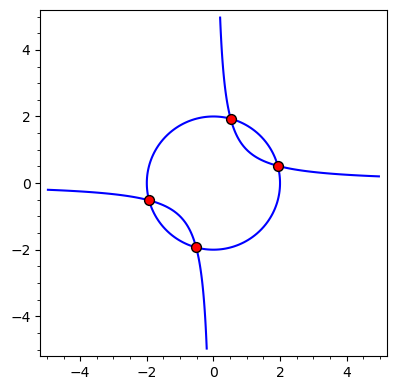

In [3]:
x,y = var('x y')
poly1 = x**2 + y**2 - 4
p = [implicit_plot(poly1, xrange=(-5,5), yrange=(-5,5))]

poly2 = x * y - 1
p.append(implicit_plot(poly2, xrange=(-5,5), yrange=(-5,5)))

R.<x,y> = RR[]
J = R.ideal(x**2 + y**2 - 4,x * y - 1) #intersection = solve([poly1, poly2], [x,y])

int_x = [j[x] for j in J.variety()] #[point[0].rhs() for point in intersection]
int_y = [j[y] for j in J.variety()] #[point[1].rhs() for point in intersection]
p.append(scatter_plot(list(zip(int_x, int_y)), facecolor='red'))
sum(p)

So, blue varieties -- are exactly the varieties in left hand-side. Four red points are the variety on the right hand-side, and, of course, is the intersection of blue ones $\bullet$

**2.** Sketch $V((x − 2)(x^2 − y), y(x^2 − y), (z + 1)(x^2 − y))$ in $\mathbb{R}^3$ .

$\circ$ From the previous problem, 
$$V((x − 2)(x^2 − y), y(x^2 − y), (z + 1)(x^2 − y)) = V((x-2)(x^2-y) \cap V(y(x^2-y)) \cap V((z+1)(x^2-y)) $$

So we can look at all these affine varieties, more concretely, at their intersections

In [4]:
x,y,z = var('x,y,z')

V = [(x-2)*(x^2-y), y*(x^2-y), (z+1)*(x^2-y)]
c=['red','blue', 'green']

p=add([implicit_plot3d(V[i],[x,-10,10],[y,-10,10],[z,-10,10], color=c[i]) for i in [0..2]]) 

show(p)

Graphics3d Object

Let's solve the appropriate system and plot the variety itself using Sage:

In [5]:
soln = solve([(x-2)*(x^2-y), y*(x^2-y), (z+1)*(x^2-y)], [x,y,z])
print(soln)

plots = []

for sol in soln:
    plots.append(parametric_plot3d(list(map(lambda x: x.rhs() ,sol)), (-5,5), (-5, 5), color='orange'))
    
sum(plots)

[
[x == r1, y == r1^2, z == r2],
[x == 0, y == 0, z == -1],
[x == 2, y == 0, z == -1]
]


Graphics3d Object

**3.** Let us show that all finite subsets of $\mathbb{k}^n$ are affine varieties

(a) Prove that a single point $(a_1 , ..., a_n ) \in \mathbb{k}^n$ is an affine variety.

(b) Prove that every finite subset of $\mathbb{k}^n$ is an affine variety

$\circ$ Let's start with (a):

(a): Recall that $V$ is an affine variety if $\exists f_1, ..., f_s \in \mathbb{k}[x_1, ..., x_n]$ such that $\forall v \in V: f_i(v) = 0$. Thus a single point $(a_1, ..., a_n)$ is surely an affine variety(or, to be correctly, *the set* that consists of that one point): we need just to show appropriate system of polynomial equations such that it has only one solutions -- this point. The system

$$ \begin{cases}
x_1 - a_1 = 0,\\
x_2 - a_2 = 0,\\
...\\
x_n - a_n = 0
\end{cases}$$

is such one.

(b): We know, that if $V$ and $W$ are affine varieties, then so is $V \cup W$. 

Consider a finite subset $V$ of $\mathbb{k}^n$. Since $V$ is finite, $V = \{ v_1, ..., v_n \}$. Each $\{v_i\}$ is an affine variety by (a). Then so is $V = \bigcup \{v_i\}$. $\bullet$

**4.** Let $R = \{(x, y) \in \mathbb{R}^2 |y > 0\}$ be the upper half plane. Prove that $R$ is not
an affine variety.

$\circ$ Suppose $R$ is an affine variety. Let $V$  be an affine variety $V(y-x^2)$, which is just a line that passes through $(0,0)$, so it's just a variety defined by $f(x,y) = y - x^2$. Then by previous considerations, $C = R \cap V$ is an affine variety as well. Now, consider $g(t) = f(t,t^2)$. Then $g$ is zero-function on $C$, so it's a zero polynomial. Thus, $g(0) = f(0,0) = 0$, and therefore $R$ is not an affine variety. $\bullet$

**5.** Let $V \subset \mathbb{k}^n$ and $W \subset \mathbb{k}^m$ be two affine varieties, and let
$$V\times W = \{(x_1 , ..., x_n , y_1 , ..., y_m ) \in \mathbb{k}^{n+m} |(x_1 , ..., x_n ) \in V, (y_1 , ..., y_m ) \in W\}$$
be their Cartesian product. Prove that $V\times W$ is an affine variety in $\mathbb{k}^{n+m}$ .

$\circ$ Since $V, W$ are varieties, then let $V = V(f_1, ..., f_s)$ and $W = V(g_1, ..., g_r)$, where $f_i \in \mathbb{k}[x_1, ..., x_n]$ and $g_i \in \mathbb{k}[y_1, ..., y_m]$. Then we can regard $f_i$ and $g_i$ as polynomials in $\mathbb{k}[x_1, ..., x_n, y_1, ..., y_m]$. 

Then consider $V(f_1, ..., f_s, g_1, ..., g_r)$. I claim that $V \times W = V(f_1, ..., f_s, g_1, ..., g_r)$. 

The $\subseteq$ part: let $(a_1, ..., a_n, b_1, ..., b_m) \in V \times W$. Clearly, both $f_i$ and $g_i$ vanish at this point. 

The $\supseteq$ part: let $(a_1, ..., a_n, b_1, ..., b_m) \in V(f_1, ..., f_s, g_1, ..., g_r)$. Then it's also clear that $(a_1, ..., a_n, b_1, ..., b_m) \in V \times W$ since $f_i$ vanishes on $(a_1, ..., a_n)$ (then $(a_1, ..., a_n) \in V$)and $g_i$ vanishes on $(b_1, ..., b_m)$ (then $(b_1, ..., b_m) \in W$). $\bullet$

## Lecture 4: Parametrizations of Affine Varieties

**1.** Given $f \in \mathbb{k}[x]$, find a parametrization of $V(y − f(x))$.

$\circ$ Parametrization of $V(y-f(x))$ is a system 

$$ \begin{cases}
x = r_1(t),\\
y = r_2(t)
\end{cases}$$

Since $V(y-f(x)) = \{ (x,y) \in \mathbb{k}^2 : y - f(x) = 0 \}$, the next parametrization should work:

$$ \begin{cases}
x = t,\\
y = f(t)
\end{cases}$$

**2.** Consider the curve defined by $y^2 = cx^2 − x^3$, where $c$ is some constant.

(a) Show that a line will meet this curve at either $0$, $1$, $2$, or $3$ points.
Illustrate your answer with a picture.

(b) Show that a nonvertical line through the origin meets the curve at
exactly one other point when $m^2\neq c$. Draw a picture to illustrate
this, and see if you can come up with an intuitive explanation as to
why this happens.

(c) Now draw the vertical line $x = 1$. Given a point $(1, t)$ on this line,
draw the line connecting $(1, t)$ to the origin. This will intersect the
curve in a point $(x, y)$. Draw a picture to illustrate this, and argue
geometrically that this gives a parametrization of the entire curve.

(d) Show that the geometric description from part (c) leads to the parametriza-
tion
$$\begin{cases}
x = c − t^2 ,\\
y = t(c − t^2 ).
\end{cases}$$

$\circ$ Let's start with (a):

Let's at first look at this curve with different values of $c$:

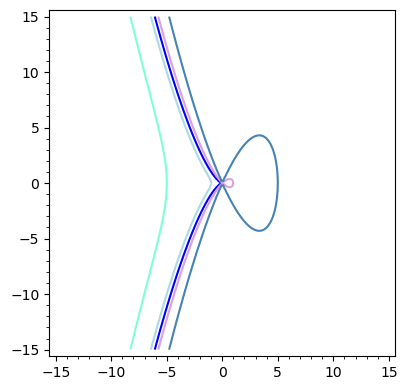

In [6]:
x,y = var('x,y')

cs = [-5, -1, 0, 1, 5]
colors = ['aquamarine', 'automatic', 'blue', 'plum', 'steelblue']
plots = []

for i in range(len(cs)):
    plots.append(
        implicit_plot(y^2 == cs[i]*x^2 - x^3, (x,-15,15), (y,-15,15), color = colors[i])
    )
    
sum(plots)

Easy to see, that there exist lines, that meet the curve at $0, 1, 2$ or $3$ points. 

Formally, let $x=a$ for some $a$. Then $y^2 = a^2(c-a)$. Then there are 3 cases:
 * $a > 0$: RHS is negative, and so line doesn't meet the curve
 * $a = 0$: The only meeting poing then is $(0,0)$. 
 * $a < 0$: RHS is positive, so line meets the curve at 2 points
 
If $y = mx+b$, then $(mx+b)^2 = cx^2 - x^3$, which simplifies to
$$ x^3 + (m^2-c)x^2 + 2mbx + b^2 = 0. $$

And by fundamental theorem of algebra, it has at most 3 roots.

(b): Let's draw a picture first. For this, fix $c=1$ and draw several lines.

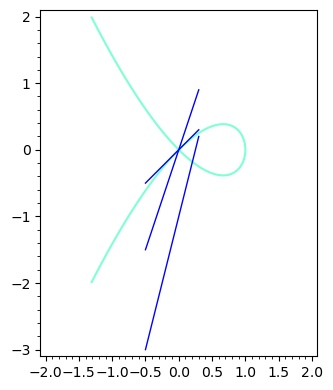

In [29]:
x,y = var('x,y')

curve = y^2 == x^2 - x^3
lines = [x, 3*x, 4*x-1]

plots = [implicit_plot(curve, (x,-2,2), (y,-2,2), color = 'aquamarine')]

for line in lines:
    plots.append(plot(line, -0.5, 0.3))

sum(plots)

Let's work it out formally: we have
$$ x^2(x + (m^2-c)) = 0 $$
So the roots are only $0$ and $m^2-c$

(c): Let's plot again:

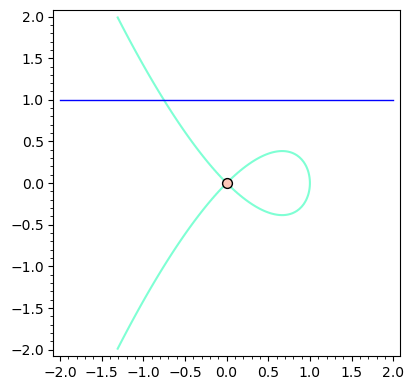

In [35]:
x,y = var('x,y')

curve = y^2 == x^2 - x^3

plots = [implicit_plot(curve, (x,-2,2), (y,-2,2), color = 'aquamarine'),
         plot(1, -2,2),
         scatter_plot([(0,0)])]


sum(plots)

Let's consider $(1,t)$ which lies on the line $x=1$ and connect it with $(0,0)$. Then the line that passes through these 2 points has the equation
$$ y = tx $$
Let's draw it:

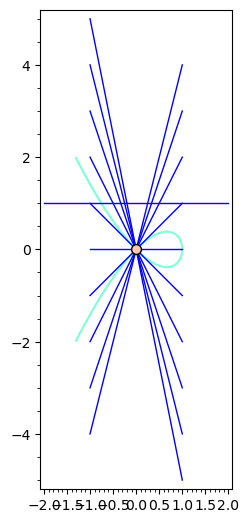

In [61]:
x,y, t = var('x,y, t')

curve = y^2 == x^2 - x^3
connect_line = t*x

plots = [implicit_plot(curve, (x,-2,2), (y,-2,2), color = 'aquamarine', figsize=8),
         plot(1, -2,2),
         scatter_plot([(0,0)])]

for p in range (-5,5):
    plots.append(plot(connect_line.subs(t==p), -1,1))


sum(plots)

as $t$ ranges from $-\infty$ to $\infty$ the line meets the curve at all points.

(d): Let's parametrize the curve:

Since $y=tx$, we can put it in the equation:
$$ t^2x^2 = cx^2 - x^3, $$
cancelling out $x^2$, we get that $x = c - t^2$, thus $y = t(c-t^2)$.

## Lecture 5: Ideals

**1.** Show that $V(x + xy, y + xy, x^2 , y^2 ) = V(x, y)$.

$\circ$ Observe that $x+xy = x(1+y)$, and therefore $x+xy \in <x>$. Similarly, $y+xy = y(1+x) \in <y>$; $x^2 \in <x>$ and $y^2 \in <y>$, which is obvious. Thus, $<x,y> = <x+xy, y+xy, x^2, y^2>$, therefore varieties are equal. $\bullet$

**2.** Show that $I(V(x^n , y^m )) = ⟨x, y⟩$ for any positive integers n and m

$\circ$ From Hilbert's Nullstellensatz, $I(V(\alpha)) = \sqrt(\alpha)$, where $\sqrt(\alpha)$ is the radical of the ideal. And $\sqrt(<x^n, y^m>) = <x,y>$. 

Another way: Since $V(x^n, y^m) = V(x^n) \cap V(y^m)$, we can write down each variety:
 * $V(x^n) = \{ (0,y) : y \in \mathbb{k} \} = V(x)$
 * $V(y^m) = \{ (x,0) : x \in \mathbb{k} \} = V(y)$
 
Thus, $V(x^n, y^m) = V(x^n) \cap V(y^m) = V(x) \cap V(y) = V(x,y)$, therefore $<x,y> \subseteq I(V(x,y)) = I(V(x^n, y^m))$

For converse inclusion, notice that $(0,0) \in V(x^n, y^m)$, so any polynomial $f \in I(V(x^n, y^m))$ can't have nonzero constant term, hence $f \in <x,y>$. Thus, $I(V(x^n, y^m)) = <x,y>$$\bullet$

**3.** Let $V \subset \mathbb{R}^3$ be the curve parametrized by $(t^2 , t^3 , t^4 )$.

 (a) Prove that $V$ is an affine variety.
 
 (b) Determine $I(V)$.

$\circ$ Let's start with (a): In order to prove that $V$ is an affine variety, I need to find the defining polynomials $f_1, f_2, ..., f_s$ in $\mathbb{k}[x,y,z]$ such that $V(f_1, ..., f_s) = V$. 

So, since $x = t^2$, $y = xt$ and $z = x^2$, so $f_1 = z - x^2$. To find another polynomial, consider what we have now:
$$\begin{cases}
x = t^2,\\
y = xt.
\end{cases}$$
So $t = \frac{y}{x}$, and $x = \frac{y^2}{z}$, from which we can derive that $f_2 = y^2 - xz$. Thus, 
$$ V \subseteq V(y^2 - xz, z - x^2) $$
To prove the converse, let $P=(a,b,c) \in V(y^2 - xz, z - x^2)$, so $ac=b^2$ and $a^2=c$. If $a = 0$, then $P = (0,0,0)$ and in this case, $P \in V$(corr. to $t=0$). If $a \neq 0$, then because of the relations, let $r = \frac{b}{a}$, and then 
$$ P = (a,b,c) = (r^2, r^3, r^4). $$
Hence, $V = V(y^2 - xz, z - x^2)$.

In [17]:
""" something strange on the plot; red parametrized line doesn't match with the intersection of 2 surfaces """

x,y,z,t = var("x,y,z,t")
plots = [implicit_plot3d(y^2-x*z,xrange=(-15,15), yrange=(-15,15), zrange=(-15,15)),
        implicit_plot3d(z-x^2,xrange=(-15,15), yrange=(-15,15), zrange=(-15,15)),
        parametric_plot3d((t^2,t^3,t^4), (-2,2), color='red', thickness=5)]
    
sum(plots)

Graphics3d Object

(b) Now, let's determine $I(V)$. Recall that
$$ I(V) = \{ f \in k[x_1, x_2, x_3] : \forall x \in V: f(x) = 0 \}. $$
The considerations above doesn't depend on the ring, thus by Hilbert's Nullstellensatz, $I(V(J)) = \sqrt{J}$, so 
$$ I(V(y^2 - xz, z - x^2)) = \sqrt{\left<y^2 - xz, z - x^2\right>}. $$
But $$ \mathbb{k}[x,y,z] / \left<y^2 - xz, z - x^2\right> = \mathbb{k}[x,y] / \left<y^2 - x^3\right>.$$
But $y^2 - x^3$ is irreducible: using Eisenstein's criterion, consider $y^2-x^3 \in \mathbb{k}[x][y]$ and prime ideal $p=(x)$. Then criterion implies that $y^2-x^3$ is irreducible, thus $\left<y^2-x^3\right>$ is prime, and therefore $$ I(V(y^2 - xz, z - x^2)) = \sqrt{\left<y^2 - xz, z - x^2\right>} = \left<y^2 - xz, z - x^2\right>. \bullet $$

**4.** The system of equations $f_1 = ... = f_s = 0$ gives the ideal $I = \left<f_1 , ..., f_s \right>$ of polynomial consequences. Now suppose that the system has a consequence of the form $f = g$ and we take the $m$-th power of each side to obtain $f^m = g^m$ . In terms of the ideal $I$, this means that $f − g \in I$ should imply $f^m − g^m \in I$. Prove this by factoring $f^m − g^m $.

$\circ$ Let's just divide $f^m-g^m$ by $f-g$, we obtain:
$$ f^m - g^m = (f-g)(f^{m-1} + f^{m-2}g + ... + fg^{m-2} + g^{m-1}), $$
So, indeed, $f-g \in I$ implies $f^m - g^m \in I$. $\bullet$

**5.** (a) Prove that $xy \notin \left<x^2,y^2\right>$

(b) Prove that $1, x, y, xy$ are the only monomials not contained in $\left<x^2, y^2\right>$.

$\circ$ (a): Suppose, $xy \in \left<x^2,y^2\right>$. Then $xy = ax^2 + by^2$ for some $a,b \in \mathbb{k}[x,y]$. But degree in RHS in either $x$ or $y$ can't be less than $2$, whileas the degree in LHS in either $x$ or $y$ is only $1$. So $xy \notin \left<x^2, y^2\right>$, but in $\mathrm{rad} \left<x^2,y^2\right> = \left<x,y\right>$.

(b): Let $a$ be the other monomial that is not contained in $\left<x^2,y^2\right>$. Since it's not $1,x,y,xy$, it has degree in either $x$ or $y$ at least $2$. But then it factors by the generators, and thus lies inside the ideal. $\bullet$